In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
Mounted at /content/drive


In [2]:
!apt-get install -y unzip >/dev/null

# 這裡是你雲端上的 zip 路徑，如果你放在子資料夾，路徑記得改
ZIP_PATH = "/content/drive/MyDrive/csiro-biomass.zip"

# 解壓到 Colab 本機
TARGET_DIR = "/content/csiro-biomass"
!unzip -o -q "$ZIP_PATH" -d "$TARGET_DIR"

# 看一下解壓後內容
!ls -R "$TARGET_DIR"

/content/csiro-biomass:
sample_submission.csv  test  test.csv  train  train.csv

/content/csiro-biomass/test:
ID1001187975.jpg

/content/csiro-biomass/train:
ID1011485656.jpg  ID1463690813.jpg  ID196516535.jpg   ID574213894.jpg
ID1012260530.jpg  ID146920896.jpg   ID1970522802.jpg  ID576137678.jpg
ID1025234388.jpg  ID1471216911.jpg  ID1976436386.jpg  ID576621307.jpg
ID1028611175.jpg  ID1472525822.jpg  ID1980675327.jpg  ID577112774.jpg
ID1035947949.jpg  ID1473228876.jpg  ID1982662138.jpg  ID587125778.jpg
ID1036339023.jpg  ID1474775613.jpg  ID1988033238.jpg  ID588120964.jpg
ID1049634115.jpg  ID147528735.jpg   ID1989506559.jpg  ID600602588.jpg
ID1051144034.jpg  ID1476045099.jpg  ID1993907137.jpg  ID605134229.jpg
ID1052620238.jpg  ID1477176296.jpg  ID1997244125.jpg  ID610397481.jpg
ID105271783.jpg   ID1488408526.jpg  ID2002797732.jpg  ID617132135.jpg
ID1053972079.jpg  ID1496750796.jpg  ID2003438517.jpg  ID61833032.jpg
ID1058383417.jpg  ID1498398599.jpg  ID2006686196.jpg  ID6269659.jpg
ID106

In [18]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 31.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=35c94e783b4a7f0e577231d8cc8ea33a77e39267acec92895ef4b1eb0c0fa361
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [ ]:
# ==========================================
# 0. Imports & Global Config
# ==========================================
import os
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

import timm
from prettytable import PrettyTable

# Grad-CAM
try:
    from pytorch_grad_cam import GradCAM
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    from pytorch_grad_cam.utils.image import show_cam_on_image
    HAS_GRADCAM = True
except ImportError:
    HAS_GRADCAM = False
    print("Warning: grad-cam not installed, Grad-CAM heatmaps will be disabled.")

# ---------- Global Settings ----------
BASE_DIR = '/content/csiro-biomass'     
TRAIN_CSV_PATH = os.path.join(BASE_DIR, 'train.csv')
TEST_CSV_PATH = os.path.join(BASE_DIR, 'test.csv')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEED = 42

META_COLS = ['State', 'Species', 'Pre_GSHH_NDVI', 'Height_Ave_cm', 'Month']
TARGET_COLS = ['Dry_Clover_g', 'Dry_Dead_g', 'Dry_Green_g', 'Dry_Total_g', 'GDM_g']
TARGET_GDM_IDX = 4   # 我們用 GDM_g 當主要目標

print(f"Using device: {DEVICE}")

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed(SEED)

# 用來存每個模型的 history / model，後面 cell 會一直加東西進來
histories = {}
models_trained = {}


Using device: cuda


In [4]:
# ==========================================
# 1. Data Loading & Preprocessing
# ==========================================
train_df_raw = pd.read_csv(TRAIN_CSV_PATH)
test_df_raw = pd.read_csv(TEST_CSV_PATH)

print("Raw train shape:", train_df_raw.shape)
print("Raw test shape:", test_df_raw.shape)

# ----- 補齊 test 缺失欄位 -----
required_cols = ['Sampling_Date', 'State', 'Species', 'Pre_GSHH_NDVI', 'Height_Ave_cm']
for col in required_cols:
    if col not in test_df_raw.columns:
        print(f"[Fill] adding missing test column: {col}")
        if col in ['Sampling_Date', 'State', 'Species']:
            mode_val = train_df_raw[col].mode()[0]
            test_df_raw[col] = mode_val
        else:
            mean_val = train_df_raw[col].mean()
            test_df_raw[col] = mean_val

def preprocess_data(df, is_train=True):
    df = df.copy()
    df['Sampling_Date'] = pd.to_datetime(df['Sampling_Date'])
    df['Month'] = df['Sampling_Date'].dt.month

    meta_cols = ['image_path', 'State', 'Species',
                 'Pre_GSHH_NDVI', 'Height_Ave_cm', 'Month']
    df_wide = df[meta_cols].drop_duplicates(subset=['image_path']).reset_index(drop=True)

    if is_train:
        for t in TARGET_COLS:
            temp = df[df['target_name'] == t][['image_path', 'target']].rename(columns={'target': t})
            df_wide = df_wide.merge(temp, on='image_path', how='left')
        return df_wide
    else:
        return df_wide

train_df = preprocess_data(train_df_raw, is_train=True)
test_df = preprocess_data(test_df_raw, is_train=False)

# 類別編碼
cat_cols = ['State', 'Species']
for col in cat_cols:
    le = LabelEncoder()
    full = pd.concat([train_df[col], test_df[col]], axis=0).astype(str)
    le.fit(full)
    train_df[col] = le.transform(train_df[col].astype(str))
    test_df[col] = le.transform(test_df[col].astype(str))

# 數值標準化
num_cols = ['Pre_GSHH_NDVI', 'Height_Ave_cm', 'Month']
scaler = StandardScaler()
train_df[num_cols] = scaler.fit_transform(train_df[num_cols])
test_df[num_cols] = scaler.transform(test_df[num_cols])

train_df = train_df.fillna(0)
test_df = test_df.fillna(0)

print("Data prepared.")
print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)


Raw train shape: (1785, 9)
Raw test shape: (5, 3)
[Fill] adding missing test column: Sampling_Date
[Fill] adding missing test column: State
[Fill] adding missing test column: Species
[Fill] adding missing test column: Pre_GSHH_NDVI
[Fill] adding missing test column: Height_Ave_cm
Data prepared.
Train shape: (357, 11)
Test shape: (1, 6)
Raw train shape: (1785, 9)
Raw test shape: (5, 3)
[Fill] adding missing test column: Sampling_Date
[Fill] adding missing test column: State
[Fill] adding missing test column: Species
[Fill] adding missing test column: Pre_GSHH_NDVI
[Fill] adding missing test column: Height_Ave_cm
Data prepared.
Train shape: (357, 11)
Test shape: (1, 6)


In [ ]:
# ==========================================
# 2. Dataset / Transforms
# ==========================================
class PastureDataset(Dataset):
    """
    - train/val: (image_tensor, meta_tensor, target_tensor)
    - test:      (image_tensor, meta_tensor)
    """
    def __init__(self, df, root_dir, transforms=None, target_cols=None, meta_cols=None):
        self.df = df.reset_index(drop=True)
        self.root_dir = root_dir
        self.transforms = transforms
        self.target_cols = target_cols
        self.meta_cols = meta_cols

        if meta_cols is not None:
            self.meta_data = self.df[meta_cols].values.astype(np.float32)
        else:
            self.meta_data = None

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.root_dir, row['image_path'])

        try:
            img = Image.open(img_path).convert('RGB')
        except:
            img = Image.fromarray(np.zeros((224, 224, 3), dtype=np.uint8))

        if self.transforms:
            img = self.transforms(img)

        if self.meta_data is not None:
            meta = torch.tensor(self.meta_data[idx])
        else:
            meta = torch.empty(0)

        if self.target_cols is None:
            return img, meta

        target = self.df.iloc[idx][self.target_cols].values.astype(np.float32)
        target = torch.tensor(target)

        return img, meta, target


class MTLDataset(Dataset):
    def __init__(self, base_dataset, masks):
        self.base_dataset = base_dataset
        self.masks = masks

    def __len__(self):
        return len(self.base_dataset)

    def __getitem__(self, idx):
        img, meta, target = self.base_dataset[idx]
        m = self.masks[idx]
        mask = torch.tensor(m).unsqueeze(0)  # (1,H,W)
        return img, meta, target, mask


# Transforms
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

# Train/Val split
train_split, val_split = train_test_split(train_df, test_size=0.2, random_state=SEED)

train_dataset = PastureDataset(train_split, BASE_DIR, train_transforms,
                               target_cols=TARGET_COLS, meta_cols=META_COLS)
val_dataset = PastureDataset(val_split, BASE_DIR, val_transforms,
                             target_cols=TARGET_COLS, meta_cols=META_COLS)

train_loader_base = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader_base = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)

print("Train samples:", len(train_dataset))
print("Val samples:", len(val_dataset))


Train samples: 285
Val samples: 72


In [23]:
# ==========================================
# 3. Model & Utils (train, pseudo masks, plots, 1x6 vis)
# ==========================================
class SoftMaskAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.mask_net = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // reduction, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels // reduction, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        mask = self.mask_net(x)
        return x * mask, mask


class SegDecoder(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.layers = nn.Sequential(
            nn.ConvTranspose2d(in_channels, 256, 4, 2, 1), nn.BatchNorm2d(256), nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.BatchNorm2d(64), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1), nn.BatchNorm2d(32), nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 4, 2, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.layers(x)


class PastureAblationModel(nn.Module):
    def __init__(self, n_outputs=5, n_meta_features=len(META_COLS),
                 use_soft_mask=False, use_mtl=False):
        super().__init__()
        self.use_soft_mask = use_soft_mask
        self.use_mtl = use_mtl

        self.cnn = timm.create_model('efficientnet_b0',
                                     pretrained=True,
                                     num_classes=0,
                                     global_pool='')
        self.n_cnn_features = 1280

        if self.use_soft_mask:
            self.attention = SoftMaskAttention(self.n_cnn_features)

        self.global_pool = nn.AdaptiveAvgPool2d(1)

        if n_meta_features > 0:
            self.meta_mlp = nn.Sequential(
                nn.Linear(n_meta_features, 128),
                nn.BatchNorm1d(128),
                nn.ReLU(),
                nn.Linear(128, 64),
                nn.ReLU()
            )
            fusion_dim = self.n_cnn_features + 64
        else:
            self.meta_mlp = None
            fusion_dim = self.n_cnn_features

        self.reg_head = nn.Sequential(
            nn.Flatten(),
            nn.Linear(fusion_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, n_outputs)
        )

        if self.use_mtl:
            self.seg_decoder = SegDecoder(self.n_cnn_features)

    def forward(self, x, meta=None, return_viz=False):
        feats = self.cnn(x)  # (B,1280,7,7)

        soft_mask = None
        seg_output = None

        feats_for_reg = feats
        if self.use_soft_mask:
            feats_for_reg, soft_mask = self.attention(feats)

        if self.use_mtl:
            seg_output = self.seg_decoder(feats)

        pooled = self.global_pool(feats_for_reg).flatten(1)  # (B,1280)

        if self.meta_mlp is not None and meta is not None and meta.nelement() > 0:
            meta_out = self.meta_mlp(meta)
            fused = torch.cat([pooled, meta_out], dim=1)
        else:
            fused = pooled

        pred = self.reg_head(fused)

        if return_viz:
            return {'pred': pred, 'soft_mask': soft_mask, 'seg_mask': seg_output}

        if self.use_mtl:
            return pred, seg_output

        return pred


def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def plot_metrics(history, title_prefix=""):
    epochs = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(18, 5))

    # Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs, history['train_loss'], label='Train')
    plt.plot(epochs, history['val_loss'], label='Val')
    plt.title(f"{title_prefix} Loss (MSE)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)

    # RMSE
    plt.subplot(1, 3, 2)
    plt.plot(epochs, history['val_rmse'], label='Val RMSE', color='orange')
    plt.title(f"{title_prefix} Val RMSE")
    plt.xlabel("Epoch")
    plt.ylabel("RMSE")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)

    # R2
    plt.subplot(1, 3, 3)
    plt.plot(epochs, history['val_r2'], label='Val R2', color='green')
    plt.axhline(0, color='red', linestyle='--', alpha=0.4)
    plt.title(f"{title_prefix} Val R2")
    plt.xlabel("Epoch")
    plt.ylabel("R2")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()


def train_and_evaluate(
    model,
    train_loader,
    val_loader,
    device,
    epochs=20,
    lr=3e-4,
    lambda_seg=0.3,
    experiment_name="Exp"
):
    print(f"\n===== Starting Experiment: {experiment_name} =====")

    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.5,
        patience=3
    )

    criterion_main = nn.MSELoss()
    criterion_seg = nn.BCELoss()

    history = {
        'train_loss': [],
        'val_loss': [],
        'val_rmse': [],
        'val_r2': [],
    }

    for epoch in range(epochs):
        # ---- Train ----
        model.train()
        train_losses = []

        for batch in tqdm(train_loader, desc=f"Train {experiment_name} (Epoch {epoch+1})", leave=False):
            if len(batch) == 3:
                imgs, metas, targets = batch
                masks = None
            else:
                imgs, metas, targets, masks = batch
                masks = masks.to(device)

            imgs = imgs.to(device)
            metas = metas.to(device)
            targets = targets.to(device)

            y = targets[:, TARGET_GDM_IDX:TARGET_GDM_IDX+1]

            optimizer.zero_grad()
            outputs = model(imgs, metas)

            if isinstance(outputs, tuple):
                pred_main, pred_seg = outputs
            else:
                pred_main = outputs
                pred_seg = None

            if pred_main.ndim == 2 and pred_main.shape[1] > 1:
                pred_main_target = pred_main[:, TARGET_GDM_IDX:TARGET_GDM_IDX+1]
            else:
                pred_main_target = pred_main

            loss_main = criterion_main(pred_main_target, y)

            use_seg_loss = (
                hasattr(model, "use_mtl") and model.use_mtl
                and (pred_seg is not None) and (masks is not None)
            )

            if use_seg_loss:
                loss_seg = criterion_seg(pred_seg, masks)
                loss = loss_main + lambda_seg * loss_seg
            else:
                loss = loss_main

            loss.backward()
            optimizer.step()
            train_losses.append(loss.item())

        avg_train_loss = float(np.mean(train_losses))

        # ---- Val ----
        model.eval()
        val_losses = []
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for batch in tqdm(val_loader, desc=f"Val {experiment_name} (Epoch {epoch+1})", leave=False):
                if len(batch) == 3:
                    imgs, metas, targets = batch
                    masks = None
                else:
                    imgs, metas, targets, masks = batch
                    masks = masks.to(device)

                imgs = imgs.to(device)
                metas = metas.to(device)
                targets = targets.to(device)

                y = targets[:, TARGET_GDM_IDX:TARGET_GDM_IDX+1]

                outputs = model(imgs, metas)
                if isinstance(outputs, tuple):
                    pred_main, pred_seg = outputs
                else:
                    pred_main = outputs
                    pred_seg = None

                if pred_main.ndim == 2 and pred_main.shape[1] > 1:
                    pred_main_target = pred_main[:, TARGET_GDM_IDX:TARGET_GDM_IDX+1]
                else:
                    pred_main_target = pred_main

                loss_main = criterion_main(pred_main_target, y)

                use_seg_loss = (
                    hasattr(model, "use_mtl") and model.use_mtl
                    and (pred_seg is not None) and (masks is not None)
                )
                if use_seg_loss:
                    loss_seg = criterion_seg(pred_seg, masks)
                    loss = loss_main + lambda_seg * loss_seg
                else:
                    loss = loss_main

                val_losses.append(loss.item())
                all_preds.append(pred_main_target.cpu().numpy())
                all_targets.append(y.cpu().numpy())

        avg_val_loss = float(np.mean(val_losses))
        all_preds = np.concatenate(all_preds, axis=0)
        all_targets = np.concatenate(all_targets, axis=0)
        val_rmse = float(np.sqrt(mean_squared_error(all_targets, all_preds)))
        val_r2 = float(r2_score(all_targets, all_preds))

        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['val_rmse'].append(val_rmse)
        history['val_r2'].append(val_r2)

        scheduler.step(avg_val_loss)

        print(f"[{experiment_name}] Epoch {epoch+1}/{epochs} | "
              f"Train Loss: {avg_train_loss:.4f} | "
              f"Val Loss: {avg_val_loss:.4f} | "
              f"Val RMSE: {val_rmse:.4f} | "
              f"Val R2: {val_r2:.4f}")

    return model, history


def generate_pseudo_masks(model_soft, dataset, device, threshold=0.4):
    loader = DataLoader(dataset, batch_size=32, shuffle=False)
    model_soft.eval()
    model_soft.to(device)
    all_masks = []

    with torch.no_grad():
        for batch in tqdm(loader, desc="Generating Pseudo Masks"):
            imgs, metas, _ = batch
            imgs = imgs.to(device)
            metas = metas.to(device)

            out = model_soft(imgs, metas, return_viz=True)
            soft_mask = out['soft_mask']

            if soft_mask is None:
                b = imgs.size(0)
                for _ in range(b):
                    all_masks.append(np.zeros((224, 224), dtype=np.float32))
                continue

            m_np = soft_mask.cpu().numpy()
            for j in range(m_np.shape[0]):
                m = m_np[j, 0]
                m_resized = cv2.resize(m, (224, 224), interpolation=cv2.INTER_CUBIC)
                m_bin = (m_resized > threshold).astype(np.float32)
                all_masks.append(m_bin)

    return np.array(all_masks)


# ---------- 1x6 Visualization ----------
def inverse_normalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = tensor.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img.astype(np.float32)


def compute_exg_mask_numpy(rgb_img_np, threshold=0.4):
    r = rgb_img_np[:, :, 0]
    g = rgb_img_np[:, :, 1]
    b = rgb_img_np[:, :, 2]
    exg = 2 * g - r - b
    exg_norm = (exg - exg.min()) / (exg.max() - exg.min() + 1e-8)
    mask = (exg_norm > threshold).astype(np.float32)
    return mask


class ModelWrapperForGradCAM(torch.nn.Module):
    def __init__(self, model, fixed_meta, target_idx=TARGET_GDM_IDX):
        super().__init__()
        self.model = model
        self.fixed_meta = fixed_meta
        self.target_idx = target_idx

    def forward(self, x):
        out = self.model(x, self.fixed_meta)
        if isinstance(out, tuple):
            pred = out[0]
        elif isinstance(out, dict):
            pred = out['pred']
        else:
            pred = out

        if pred.ndim == 2 and pred.shape[1] > 1:
            pred = pred[:, self.target_idx:self.target_idx+1]
        return pred


def visualize_analysis_1x6(model, dataset, idx, device, target_col_idx=TARGET_GDM_IDX):
    model.eval()
    model.to(device)

    img_tensor, meta_tensor, target_tensor = dataset[idx]
    img_input = img_tensor.unsqueeze(0).to(device)
    meta_input = meta_tensor.unsqueeze(0).to(device)

    true_val = float(target_tensor[target_col_idx].item())
    original_img = inverse_normalize(img_tensor)

    with torch.no_grad():
        try:
            out = model(img_input, meta_input, return_viz=True)
        except TypeError:
            out = model(img_input, meta_input)

    if isinstance(out, dict):
        pred = out['pred']
        soft_mask = out.get('soft_mask', None)
    elif isinstance(out, tuple):
        pred = out[0]
        soft_mask = None
    else:
        pred = out
        soft_mask = None

    if pred.ndim == 2 and pred.shape[1] > 1:
        pred_val = float(pred[0, target_col_idx].item())
    else:
        pred_val = float(pred[0].item())

    H, W = img_tensor.shape[1], img_tensor.shape[2]

    pseudo_mask_np = compute_exg_mask_numpy(original_img)

    if soft_mask is not None:
        sm_up = F.interpolate(soft_mask, size=(H, W), mode="bilinear", align_corners=False)
        sm_np = sm_up[0, 0].detach().cpu().numpy()
        sm_np = (sm_np - sm_np.min()) / (sm_np.max() - sm_np.min() + 1e-8)
    else:
        sm_np = np.zeros((H, W), dtype=np.float32)

    soft_overlay = original_img * sm_np[..., None]
    soft_overlay = np.clip(soft_overlay * 1.5, 0, 1)

    if HAS_GRADCAM and hasattr(model, "cnn") and hasattr(model.cnn, "conv_head"):
        target_layer = model.cnn.conv_head
        wrapper = ModelWrapperForGradCAM(model, meta_input, target_idx=target_col_idx)
        cam = GradCAM(model=wrapper, target_layers=[target_layer])
        targets = [ClassifierOutputTarget(0)]
        grayscale_cam = cam(input_tensor=img_input, targets=targets)[0]
        gradcam_heatmap = grayscale_cam
        gradcam_overlay = show_cam_on_image(original_img, gradcam_heatmap, use_rgb=True)
    else:
        gradcam_heatmap = np.zeros((H, W), dtype=np.float32)
        gradcam_overlay = np.zeros_like(original_img)

    fig, axes = plt.subplots(1, 6, figsize=(22, 4))

    axes[0].imshow(original_img); axes[0].set_title("1) Original"); axes[0].axis("off")
    axes[1].imshow(pseudo_mask_np, cmap='gray', vmin=0, vmax=1); axes[1].set_title("2) Pseudo Mask (ExG)"); axes[1].axis("off")
    axes[2].imshow(sm_np, cmap='jet', vmin=0, vmax=1); axes[2].set_title("3) Learned Soft Mask"); axes[2].axis("off")
    axes[3].imshow(soft_overlay); axes[3].set_title("4) Soft Mask Overlay"); axes[3].axis("off")
    axes[4].imshow(gradcam_heatmap, cmap='jet', vmin=0, vmax=1); axes[4].set_title("5) Grad-CAM Heatmap"); axes[4].axis("off")
    axes[5].imshow(gradcam_overlay); axes[5].set_title("6) Grad-CAM Overlay"); axes[5].axis("off")

    plt.suptitle(f"Idx {idx} | Truth: {true_val:.2f} | Pred: {pred_val:.2f}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [21]:
print("HAS_GRADCAM =", HAS_GRADCAM)

HAS_GRADCAM = True


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public m

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]


===== Starting Experiment: 1_Baseline =====


Train 1_Baseline (Epoch 1):   0%|          | 0/9 [00:00<?, ?it/s]


===== Starting Experiment: 1_Baseline =====


Train 1_Baseline (Epoch 1):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 1):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 1):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 1/50 | Train Loss: 1699.0546 | Val Loss: 1152.4323 | Val RMSE: 36.6711 | Val R2: -1.7963


Train 1_Baseline (Epoch 2):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 1/50 | Train Loss: 1699.0546 | Val Loss: 1152.4323 | Val RMSE: 36.6711 | Val R2: -1.7963


Train 1_Baseline (Epoch 2):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 2):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 2):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 2/50 | Train Loss: 1311.7894 | Val Loss: 507.0275 | Val RMSE: 23.8887 | Val R2: -0.1866


Train 1_Baseline (Epoch 3):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 2/50 | Train Loss: 1311.7894 | Val Loss: 507.0275 | Val RMSE: 23.8887 | Val R2: -0.1866


Train 1_Baseline (Epoch 3):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 3):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 3):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 3/50 | Train Loss: 803.3273 | Val Loss: 600.8092 | Val RMSE: 27.0963 | Val R2: -0.5267


Train 1_Baseline (Epoch 4):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 3/50 | Train Loss: 803.3273 | Val Loss: 600.8092 | Val RMSE: 27.0963 | Val R2: -0.5267


Train 1_Baseline (Epoch 4):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 4):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 4):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 4/50 | Train Loss: 561.9101 | Val Loss: 359.9438 | Val RMSE: 20.4310 | Val R2: 0.1320


Train 1_Baseline (Epoch 5):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 4/50 | Train Loss: 561.9101 | Val Loss: 359.9438 | Val RMSE: 20.4310 | Val R2: 0.1320


Train 1_Baseline (Epoch 5):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 5):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 5):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 5/50 | Train Loss: 402.4491 | Val Loss: 420.8437 | Val RMSE: 20.6092 | Val R2: 0.1168


Train 1_Baseline (Epoch 6):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 5/50 | Train Loss: 402.4491 | Val Loss: 420.8437 | Val RMSE: 20.6092 | Val R2: 0.1168


Train 1_Baseline (Epoch 6):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 6):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 6):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 6/50 | Train Loss: 329.5027 | Val Loss: 307.5628 | Val RMSE: 18.4708 | Val R2: 0.2906


Train 1_Baseline (Epoch 7):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 6/50 | Train Loss: 329.5027 | Val Loss: 307.5628 | Val RMSE: 18.4708 | Val R2: 0.2906


Train 1_Baseline (Epoch 7):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 7):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 7):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 7/50 | Train Loss: 279.0266 | Val Loss: 274.1913 | Val RMSE: 17.6769 | Val R2: 0.3502


Train 1_Baseline (Epoch 8):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 7/50 | Train Loss: 279.0266 | Val Loss: 274.1913 | Val RMSE: 17.6769 | Val R2: 0.3502


Train 1_Baseline (Epoch 8):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 8):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 8):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 8/50 | Train Loss: 199.3867 | Val Loss: 166.1137 | Val RMSE: 13.7667 | Val R2: 0.6059


Train 1_Baseline (Epoch 9):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 8/50 | Train Loss: 199.3867 | Val Loss: 166.1137 | Val RMSE: 13.7667 | Val R2: 0.6059


Train 1_Baseline (Epoch 9):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 9):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 9):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 9/50 | Train Loss: 170.1774 | Val Loss: 211.7785 | Val RMSE: 14.9765 | Val R2: 0.5336


Train 1_Baseline (Epoch 10):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 9/50 | Train Loss: 170.1774 | Val Loss: 211.7785 | Val RMSE: 14.9765 | Val R2: 0.5336


Train 1_Baseline (Epoch 10):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 10):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 10):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 10/50 | Train Loss: 150.9565 | Val Loss: 229.3125 | Val RMSE: 15.4298 | Val R2: 0.5049


Train 1_Baseline (Epoch 11):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 10/50 | Train Loss: 150.9565 | Val Loss: 229.3125 | Val RMSE: 15.4298 | Val R2: 0.5049


Train 1_Baseline (Epoch 11):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 11):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 11):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 11/50 | Train Loss: 142.7759 | Val Loss: 170.1157 | Val RMSE: 12.6122 | Val R2: 0.6692


Train 1_Baseline (Epoch 12):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 11/50 | Train Loss: 142.7759 | Val Loss: 170.1157 | Val RMSE: 12.6122 | Val R2: 0.6692


Train 1_Baseline (Epoch 12):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 12):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 12):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 12/50 | Train Loss: 120.8924 | Val Loss: 145.4710 | Val RMSE: 12.7545 | Val R2: 0.6617


Train 1_Baseline (Epoch 13):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 12/50 | Train Loss: 120.8924 | Val Loss: 145.4710 | Val RMSE: 12.7545 | Val R2: 0.6617


Train 1_Baseline (Epoch 13):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 13):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 13):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 13/50 | Train Loss: 119.3823 | Val Loss: 105.9729 | Val RMSE: 11.2679 | Val R2: 0.7360


Train 1_Baseline (Epoch 14):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 13/50 | Train Loss: 119.3823 | Val Loss: 105.9729 | Val RMSE: 11.2679 | Val R2: 0.7360


Train 1_Baseline (Epoch 14):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 14):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 14):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 14/50 | Train Loss: 105.7280 | Val Loss: 176.5728 | Val RMSE: 14.2541 | Val R2: 0.5775


Train 1_Baseline (Epoch 15):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 14/50 | Train Loss: 105.7280 | Val Loss: 176.5728 | Val RMSE: 14.2541 | Val R2: 0.5775


Train 1_Baseline (Epoch 15):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 15):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 15):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 15/50 | Train Loss: 110.1268 | Val Loss: 125.8299 | Val RMSE: 12.2448 | Val R2: 0.6882


Train 1_Baseline (Epoch 16):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 15/50 | Train Loss: 110.1268 | Val Loss: 125.8299 | Val RMSE: 12.2448 | Val R2: 0.6882


Train 1_Baseline (Epoch 16):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 16):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 16):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 16/50 | Train Loss: 103.6982 | Val Loss: 140.1917 | Val RMSE: 13.0324 | Val R2: 0.6468


Train 1_Baseline (Epoch 17):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 16/50 | Train Loss: 103.6982 | Val Loss: 140.1917 | Val RMSE: 13.0324 | Val R2: 0.6468


Train 1_Baseline (Epoch 17):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 17):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 17):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 17/50 | Train Loss: 82.3857 | Val Loss: 135.5069 | Val RMSE: 12.5069 | Val R2: 0.6747


Train 1_Baseline (Epoch 18):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 17/50 | Train Loss: 82.3857 | Val Loss: 135.5069 | Val RMSE: 12.5069 | Val R2: 0.6747


Train 1_Baseline (Epoch 18):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 18):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 18):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 18/50 | Train Loss: 94.3471 | Val Loss: 116.4197 | Val RMSE: 11.4916 | Val R2: 0.7254


Train 1_Baseline (Epoch 19):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 18/50 | Train Loss: 94.3471 | Val Loss: 116.4197 | Val RMSE: 11.4916 | Val R2: 0.7254


Train 1_Baseline (Epoch 19):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 19):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 19):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 19/50 | Train Loss: 91.9318 | Val Loss: 117.4345 | Val RMSE: 11.6206 | Val R2: 0.7192


Train 1_Baseline (Epoch 20):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 19/50 | Train Loss: 91.9318 | Val Loss: 117.4345 | Val RMSE: 11.6206 | Val R2: 0.7192


Train 1_Baseline (Epoch 20):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 20):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 20):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 20/50 | Train Loss: 66.4346 | Val Loss: 119.0586 | Val RMSE: 11.4312 | Val R2: 0.7283


Train 1_Baseline (Epoch 21):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 20/50 | Train Loss: 66.4346 | Val Loss: 119.0586 | Val RMSE: 11.4312 | Val R2: 0.7283


Train 1_Baseline (Epoch 21):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 21):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 21):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 21/50 | Train Loss: 84.0310 | Val Loss: 138.1503 | Val RMSE: 12.2249 | Val R2: 0.6892


Train 1_Baseline (Epoch 22):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 21/50 | Train Loss: 84.0310 | Val Loss: 138.1503 | Val RMSE: 12.2249 | Val R2: 0.6892


Train 1_Baseline (Epoch 22):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 22):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 22):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 22/50 | Train Loss: 68.1779 | Val Loss: 139.0836 | Val RMSE: 12.0668 | Val R2: 0.6972


Train 1_Baseline (Epoch 23):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 22/50 | Train Loss: 68.1779 | Val Loss: 139.0836 | Val RMSE: 12.0668 | Val R2: 0.6972


Train 1_Baseline (Epoch 23):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 23):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 23):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 23/50 | Train Loss: 59.3311 | Val Loss: 123.5211 | Val RMSE: 11.4329 | Val R2: 0.7282


Train 1_Baseline (Epoch 24):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 23/50 | Train Loss: 59.3311 | Val Loss: 123.5211 | Val RMSE: 11.4329 | Val R2: 0.7282


Train 1_Baseline (Epoch 24):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 24):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 24):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 24/50 | Train Loss: 69.1420 | Val Loss: 118.1703 | Val RMSE: 11.3190 | Val R2: 0.7336


Train 1_Baseline (Epoch 25):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 24/50 | Train Loss: 69.1420 | Val Loss: 118.1703 | Val RMSE: 11.3190 | Val R2: 0.7336


Train 1_Baseline (Epoch 25):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 25):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 25):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 25/50 | Train Loss: 83.2805 | Val Loss: 132.3574 | Val RMSE: 12.0704 | Val R2: 0.6970


Train 1_Baseline (Epoch 26):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 25/50 | Train Loss: 83.2805 | Val Loss: 132.3574 | Val RMSE: 12.0704 | Val R2: 0.6970


Train 1_Baseline (Epoch 26):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 26):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 26):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 26/50 | Train Loss: 66.7323 | Val Loss: 123.6535 | Val RMSE: 11.7509 | Val R2: 0.7129


Train 1_Baseline (Epoch 27):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 26/50 | Train Loss: 66.7323 | Val Loss: 123.6535 | Val RMSE: 11.7509 | Val R2: 0.7129


Train 1_Baseline (Epoch 27):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 27):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 27):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 27/50 | Train Loss: 59.5797 | Val Loss: 123.2642 | Val RMSE: 11.7077 | Val R2: 0.7150


Train 1_Baseline (Epoch 28):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 27/50 | Train Loss: 59.5797 | Val Loss: 123.2642 | Val RMSE: 11.7077 | Val R2: 0.7150


Train 1_Baseline (Epoch 28):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 28):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 28):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 28/50 | Train Loss: 58.8233 | Val Loss: 120.4458 | Val RMSE: 11.5823 | Val R2: 0.7211


Train 1_Baseline (Epoch 29):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 28/50 | Train Loss: 58.8233 | Val Loss: 120.4458 | Val RMSE: 11.5823 | Val R2: 0.7211


Train 1_Baseline (Epoch 29):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 29):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 29):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 29/50 | Train Loss: 71.0733 | Val Loss: 121.5813 | Val RMSE: 11.6864 | Val R2: 0.7160


Train 1_Baseline (Epoch 30):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 29/50 | Train Loss: 71.0733 | Val Loss: 121.5813 | Val RMSE: 11.6864 | Val R2: 0.7160


Train 1_Baseline (Epoch 30):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 30):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 30):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 30/50 | Train Loss: 65.7537 | Val Loss: 123.2845 | Val RMSE: 11.6743 | Val R2: 0.7166


Train 1_Baseline (Epoch 31):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 30/50 | Train Loss: 65.7537 | Val Loss: 123.2845 | Val RMSE: 11.6743 | Val R2: 0.7166


Train 1_Baseline (Epoch 31):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 31):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 31):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 31/50 | Train Loss: 66.7009 | Val Loss: 121.8497 | Val RMSE: 11.6503 | Val R2: 0.7178


Train 1_Baseline (Epoch 32):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 31/50 | Train Loss: 66.7009 | Val Loss: 121.8497 | Val RMSE: 11.6503 | Val R2: 0.7178


Train 1_Baseline (Epoch 32):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 32):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 32):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 32/50 | Train Loss: 49.0473 | Val Loss: 122.5940 | Val RMSE: 11.5920 | Val R2: 0.7206


Train 1_Baseline (Epoch 33):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 32/50 | Train Loss: 49.0473 | Val Loss: 122.5940 | Val RMSE: 11.5920 | Val R2: 0.7206


Train 1_Baseline (Epoch 33):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 33):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 33):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 33/50 | Train Loss: 54.1734 | Val Loss: 126.1933 | Val RMSE: 11.7621 | Val R2: 0.7123


Train 1_Baseline (Epoch 34):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 33/50 | Train Loss: 54.1734 | Val Loss: 126.1933 | Val RMSE: 11.7621 | Val R2: 0.7123


Train 1_Baseline (Epoch 34):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 34):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 34):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 34/50 | Train Loss: 50.4238 | Val Loss: 123.3803 | Val RMSE: 11.6238 | Val R2: 0.7190


Train 1_Baseline (Epoch 35):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 34/50 | Train Loss: 50.4238 | Val Loss: 123.3803 | Val RMSE: 11.6238 | Val R2: 0.7190


Train 1_Baseline (Epoch 35):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 35):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 35):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 35/50 | Train Loss: 53.7014 | Val Loss: 122.0284 | Val RMSE: 11.6445 | Val R2: 0.7180


Train 1_Baseline (Epoch 36):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 35/50 | Train Loss: 53.7014 | Val Loss: 122.0284 | Val RMSE: 11.6445 | Val R2: 0.7180


Train 1_Baseline (Epoch 36):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 36):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 36):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 36/50 | Train Loss: 66.5778 | Val Loss: 121.5706 | Val RMSE: 11.5987 | Val R2: 0.7203


Train 1_Baseline (Epoch 37):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 36/50 | Train Loss: 66.5778 | Val Loss: 121.5706 | Val RMSE: 11.5987 | Val R2: 0.7203


Train 1_Baseline (Epoch 37):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 37):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 37):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 37/50 | Train Loss: 87.9896 | Val Loss: 113.6640 | Val RMSE: 11.3233 | Val R2: 0.7334


Train 1_Baseline (Epoch 38):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 37/50 | Train Loss: 87.9896 | Val Loss: 113.6640 | Val RMSE: 11.3233 | Val R2: 0.7334


Train 1_Baseline (Epoch 38):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 38):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 38):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 38/50 | Train Loss: 48.6591 | Val Loss: 119.6250 | Val RMSE: 11.4881 | Val R2: 0.7256


Train 1_Baseline (Epoch 39):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 38/50 | Train Loss: 48.6591 | Val Loss: 119.6250 | Val RMSE: 11.4881 | Val R2: 0.7256


Train 1_Baseline (Epoch 39):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 39):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 39):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 39/50 | Train Loss: 49.6892 | Val Loss: 121.4122 | Val RMSE: 11.5157 | Val R2: 0.7243


Train 1_Baseline (Epoch 40):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 39/50 | Train Loss: 49.6892 | Val Loss: 121.4122 | Val RMSE: 11.5157 | Val R2: 0.7243


Train 1_Baseline (Epoch 40):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 40):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 40):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 40/50 | Train Loss: 59.2169 | Val Loss: 119.5527 | Val RMSE: 11.4232 | Val R2: 0.7287


Train 1_Baseline (Epoch 41):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 40/50 | Train Loss: 59.2169 | Val Loss: 119.5527 | Val RMSE: 11.4232 | Val R2: 0.7287


Train 1_Baseline (Epoch 41):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 41):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 41):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 41/50 | Train Loss: 66.0837 | Val Loss: 124.6056 | Val RMSE: 11.6053 | Val R2: 0.7199


Train 1_Baseline (Epoch 42):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 41/50 | Train Loss: 66.0837 | Val Loss: 124.6056 | Val RMSE: 11.6053 | Val R2: 0.7199


Train 1_Baseline (Epoch 42):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 42):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 42):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 42/50 | Train Loss: 59.9242 | Val Loss: 124.9257 | Val RMSE: 11.6590 | Val R2: 0.7173


Train 1_Baseline (Epoch 43):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 42/50 | Train Loss: 59.9242 | Val Loss: 124.9257 | Val RMSE: 11.6590 | Val R2: 0.7173


Train 1_Baseline (Epoch 43):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 43):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 43):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 43/50 | Train Loss: 58.0730 | Val Loss: 119.1018 | Val RMSE: 11.4842 | Val R2: 0.7258


Train 1_Baseline (Epoch 44):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 43/50 | Train Loss: 58.0730 | Val Loss: 119.1018 | Val RMSE: 11.4842 | Val R2: 0.7258


Train 1_Baseline (Epoch 44):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 44):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 44):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 44/50 | Train Loss: 46.6951 | Val Loss: 118.0698 | Val RMSE: 11.4494 | Val R2: 0.7274


Train 1_Baseline (Epoch 45):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 44/50 | Train Loss: 46.6951 | Val Loss: 118.0698 | Val RMSE: 11.4494 | Val R2: 0.7274


Train 1_Baseline (Epoch 45):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 45):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 45):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 45/50 | Train Loss: 53.0002 | Val Loss: 115.5805 | Val RMSE: 11.3647 | Val R2: 0.7314


Train 1_Baseline (Epoch 46):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 45/50 | Train Loss: 53.0002 | Val Loss: 115.5805 | Val RMSE: 11.3647 | Val R2: 0.7314


Train 1_Baseline (Epoch 46):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 46):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 46):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 46/50 | Train Loss: 41.4458 | Val Loss: 116.6210 | Val RMSE: 11.4588 | Val R2: 0.7270
[1_Baseline] Epoch 46/50 | Train Loss: 41.4458 | Val Loss: 116.6210 | Val RMSE: 11.4588 | Val R2: 0.7270


Train 1_Baseline (Epoch 47):   0%|          | 0/9 [00:00<?, ?it/s]

Train 1_Baseline (Epoch 47):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 47):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 47):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 47/50 | Train Loss: 54.9106 | Val Loss: 117.3730 | Val RMSE: 11.4245 | Val R2: 0.7286


Train 1_Baseline (Epoch 48):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 47/50 | Train Loss: 54.9106 | Val Loss: 117.3730 | Val RMSE: 11.4245 | Val R2: 0.7286


Train 1_Baseline (Epoch 48):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 48):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 48):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 48/50 | Train Loss: 57.9837 | Val Loss: 116.7147 | Val RMSE: 11.3965 | Val R2: 0.7299


Train 1_Baseline (Epoch 49):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 48/50 | Train Loss: 57.9837 | Val Loss: 116.7147 | Val RMSE: 11.3965 | Val R2: 0.7299


Train 1_Baseline (Epoch 49):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 49):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 49):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 49/50 | Train Loss: 65.1314 | Val Loss: 117.5735 | Val RMSE: 11.4040 | Val R2: 0.7296


Train 1_Baseline (Epoch 50):   0%|          | 0/9 [00:00<?, ?it/s]

[1_Baseline] Epoch 49/50 | Train Loss: 65.1314 | Val Loss: 117.5735 | Val RMSE: 11.4040 | Val R2: 0.7296


Train 1_Baseline (Epoch 50):   0%|          | 0/9 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 50):   0%|          | 0/3 [00:00<?, ?it/s]

Val 1_Baseline (Epoch 50):   0%|          | 0/3 [00:00<?, ?it/s]

[1_Baseline] Epoch 50/50 | Train Loss: 60.9767 | Val Loss: 118.8196 | Val RMSE: 11.5284 | Val R2: 0.7236
[1_Baseline] Epoch 50/50 | Train Loss: 60.9767 | Val Loss: 118.8196 | Val RMSE: 11.5284 | Val R2: 0.7236


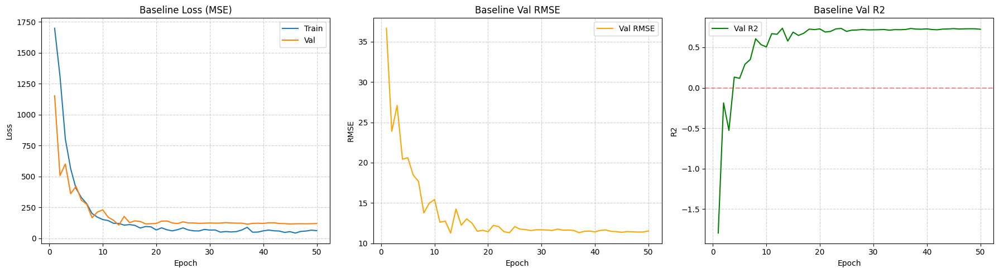

[Baseline] 1x6 visualization on val index = 14


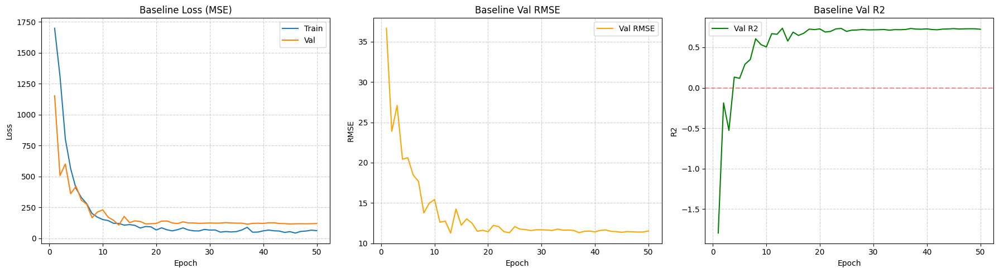

[Baseline] 1x6 visualization on val index = 14


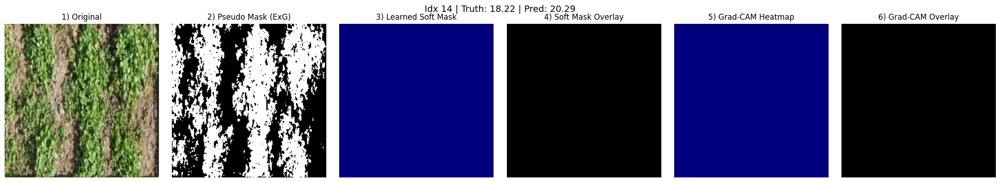

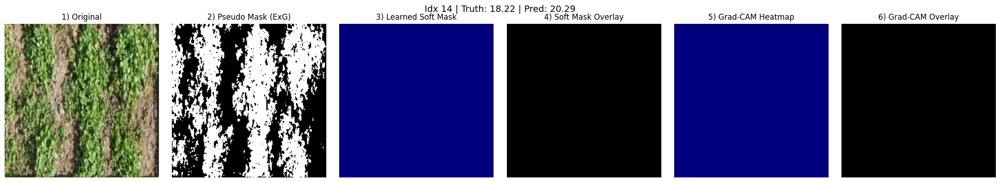

In [ ]:
# ==========================================
# Cell 1. Train Baseline
# ==========================================
EPOCHS = 50  

model_base = PastureAblationModel(
    n_outputs=5,
    n_meta_features=len(META_COLS),
    use_soft_mask=False,
    use_mtl=False
)

model_base, hist_base = train_and_evaluate(
    model_base,
    train_loader_base,
    val_loader_base,
    DEVICE,
    epochs=EPOCHS,
    lr=3e-4,
    lambda_seg=0.0,
    experiment_name="1_Baseline"
)

histories["Baseline"] = hist_base
models_trained["Baseline"] = model_base

# 畫 Baseline 的 Loss / RMSE / R2
plot_metrics(hist_base, title_prefix="Baseline")

# 1x6 視覺化 (Baseline 沒 soft mask，會是全黑的 learned soft mask 圖)
idx = random.randint(0, len(val_dataset) - 1)
print(f"[Baseline] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_base,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)



===== Starting Experiment: 2_SoftMask =====


Train 2_SoftMask (Epoch 1):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 1):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 1/50 | Train Loss: 1716.0563 | Val Loss: 1137.5664 | Val RMSE: 36.5263 | Val R2: -1.7743


Train 2_SoftMask (Epoch 2):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 2):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 2/50 | Train Loss: 1273.1908 | Val Loss: 520.0427 | Val RMSE: 23.9086 | Val R2: -0.1886


Train 2_SoftMask (Epoch 3):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 3):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 3/50 | Train Loss: 794.4316 | Val Loss: 385.6321 | Val RMSE: 21.2508 | Val R2: 0.0610


Train 2_SoftMask (Epoch 4):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 4):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 4/50 | Train Loss: 643.3385 | Val Loss: 405.8351 | Val RMSE: 21.5467 | Val R2: 0.0346


Train 2_SoftMask (Epoch 5):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 5):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 5/50 | Train Loss: 445.9889 | Val Loss: 344.5155 | Val RMSE: 20.2163 | Val R2: 0.1502


Train 2_SoftMask (Epoch 6):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 6):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 6/50 | Train Loss: 290.6967 | Val Loss: 243.2928 | Val RMSE: 16.7165 | Val R2: 0.4189


Train 2_SoftMask (Epoch 7):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 7):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 7/50 | Train Loss: 238.5477 | Val Loss: 174.0018 | Val RMSE: 14.4216 | Val R2: 0.5675


Train 2_SoftMask (Epoch 8):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 8):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 8/50 | Train Loss: 168.5695 | Val Loss: 363.9888 | Val RMSE: 21.8007 | Val R2: 0.0117


Train 2_SoftMask (Epoch 9):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 9):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 9/50 | Train Loss: 159.1644 | Val Loss: 154.6214 | Val RMSE: 13.7654 | Val R2: 0.6060


Train 2_SoftMask (Epoch 10):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 10):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 10/50 | Train Loss: 130.7021 | Val Loss: 157.3884 | Val RMSE: 13.5829 | Val R2: 0.6164


Train 2_SoftMask (Epoch 11):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 11):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 11/50 | Train Loss: 154.1516 | Val Loss: 196.6897 | Val RMSE: 15.6351 | Val R2: 0.4917


Train 2_SoftMask (Epoch 12):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 12):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 12/50 | Train Loss: 124.5463 | Val Loss: 183.0517 | Val RMSE: 14.7028 | Val R2: 0.5505


Train 2_SoftMask (Epoch 13):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 13):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 13/50 | Train Loss: 111.6106 | Val Loss: 166.1142 | Val RMSE: 14.2900 | Val R2: 0.5754


Train 2_SoftMask (Epoch 14):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 14):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 14/50 | Train Loss: 111.2585 | Val Loss: 155.2164 | Val RMSE: 13.8462 | Val R2: 0.6013


Train 2_SoftMask (Epoch 15):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 15):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 15/50 | Train Loss: 82.9961 | Val Loss: 149.3578 | Val RMSE: 13.3748 | Val R2: 0.6280


Train 2_SoftMask (Epoch 16):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 16):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 16/50 | Train Loss: 78.1877 | Val Loss: 146.1464 | Val RMSE: 13.2846 | Val R2: 0.6330


Train 2_SoftMask (Epoch 17):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 17):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 17/50 | Train Loss: 84.1166 | Val Loss: 147.4811 | Val RMSE: 13.2860 | Val R2: 0.6329


Train 2_SoftMask (Epoch 18):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 18):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 18/50 | Train Loss: 75.5482 | Val Loss: 154.7326 | Val RMSE: 13.7504 | Val R2: 0.6068


Train 2_SoftMask (Epoch 19):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 19):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 19/50 | Train Loss: 87.5154 | Val Loss: 148.7681 | Val RMSE: 13.2603 | Val R2: 0.6344


Train 2_SoftMask (Epoch 20):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 20):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 20/50 | Train Loss: 66.7157 | Val Loss: 141.0733 | Val RMSE: 12.8546 | Val R2: 0.6564


Train 2_SoftMask (Epoch 21):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 21):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 21/50 | Train Loss: 66.3051 | Val Loss: 151.4741 | Val RMSE: 13.5767 | Val R2: 0.6167


Train 2_SoftMask (Epoch 22):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 22):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 22/50 | Train Loss: 91.4285 | Val Loss: 137.9099 | Val RMSE: 12.9124 | Val R2: 0.6533


Train 2_SoftMask (Epoch 23):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 23):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 23/50 | Train Loss: 78.5643 | Val Loss: 139.3639 | Val RMSE: 12.9937 | Val R2: 0.6489


Train 2_SoftMask (Epoch 24):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 24):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 24/50 | Train Loss: 61.0870 | Val Loss: 151.9337 | Val RMSE: 13.6587 | Val R2: 0.6121


Train 2_SoftMask (Epoch 25):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 25):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 25/50 | Train Loss: 81.5402 | Val Loss: 139.2295 | Val RMSE: 12.9620 | Val R2: 0.6506


Train 2_SoftMask (Epoch 26):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 26):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 26/50 | Train Loss: 52.1321 | Val Loss: 127.6644 | Val RMSE: 12.2975 | Val R2: 0.6855


Train 2_SoftMask (Epoch 27):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 27):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 27/50 | Train Loss: 65.4873 | Val Loss: 137.0184 | Val RMSE: 12.9267 | Val R2: 0.6525


Train 2_SoftMask (Epoch 28):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 28):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 28/50 | Train Loss: 68.8856 | Val Loss: 134.2969 | Val RMSE: 12.8396 | Val R2: 0.6572


Train 2_SoftMask (Epoch 29):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 29):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 29/50 | Train Loss: 69.1731 | Val Loss: 126.1400 | Val RMSE: 12.0782 | Val R2: 0.6967


Train 2_SoftMask (Epoch 30):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 30):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 30/50 | Train Loss: 65.0187 | Val Loss: 140.7870 | Val RMSE: 12.7159 | Val R2: 0.6638


Train 2_SoftMask (Epoch 31):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 31):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 31/50 | Train Loss: 88.5830 | Val Loss: 135.0589 | Val RMSE: 12.4830 | Val R2: 0.6760


Train 2_SoftMask (Epoch 32):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 32):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 32/50 | Train Loss: 60.1202 | Val Loss: 141.5131 | Val RMSE: 12.9128 | Val R2: 0.6533


Train 2_SoftMask (Epoch 33):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 33):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 33/50 | Train Loss: 51.8712 | Val Loss: 121.4116 | Val RMSE: 11.9074 | Val R2: 0.7052


Train 2_SoftMask (Epoch 34):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 34):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 34/50 | Train Loss: 73.3192 | Val Loss: 129.8452 | Val RMSE: 12.3966 | Val R2: 0.6805


Train 2_SoftMask (Epoch 35):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 35):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 35/50 | Train Loss: 64.5650 | Val Loss: 127.3023 | Val RMSE: 12.2337 | Val R2: 0.6888


Train 2_SoftMask (Epoch 36):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 36):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 36/50 | Train Loss: 60.4528 | Val Loss: 127.9433 | Val RMSE: 12.0778 | Val R2: 0.6967


Train 2_SoftMask (Epoch 37):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 37):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 37/50 | Train Loss: 54.9187 | Val Loss: 141.0001 | Val RMSE: 12.8227 | Val R2: 0.6581


Train 2_SoftMask (Epoch 38):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 38):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 38/50 | Train Loss: 62.8062 | Val Loss: 129.9042 | Val RMSE: 12.2336 | Val R2: 0.6888


Train 2_SoftMask (Epoch 39):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 39):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 39/50 | Train Loss: 52.6495 | Val Loss: 129.1999 | Val RMSE: 12.1981 | Val R2: 0.6906


Train 2_SoftMask (Epoch 40):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 40):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 40/50 | Train Loss: 70.3053 | Val Loss: 131.9565 | Val RMSE: 12.3912 | Val R2: 0.6807


Train 2_SoftMask (Epoch 41):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 41):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 41/50 | Train Loss: 46.9926 | Val Loss: 127.7016 | Val RMSE: 12.1933 | Val R2: 0.6908


Train 2_SoftMask (Epoch 42):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 42):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 42/50 | Train Loss: 68.0981 | Val Loss: 127.4810 | Val RMSE: 12.1777 | Val R2: 0.6916


Train 2_SoftMask (Epoch 43):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 43):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 43/50 | Train Loss: 57.8819 | Val Loss: 126.1583 | Val RMSE: 12.0973 | Val R2: 0.6957


Train 2_SoftMask (Epoch 44):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 44):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 44/50 | Train Loss: 70.3187 | Val Loss: 131.2129 | Val RMSE: 12.3119 | Val R2: 0.6848


Train 2_SoftMask (Epoch 45):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 45):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 45/50 | Train Loss: 54.6048 | Val Loss: 124.5321 | Val RMSE: 12.0612 | Val R2: 0.6975


Train 2_SoftMask (Epoch 46):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 46):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 46/50 | Train Loss: 40.2466 | Val Loss: 125.3037 | Val RMSE: 12.1438 | Val R2: 0.6933


Train 2_SoftMask (Epoch 47):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 47):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 47/50 | Train Loss: 47.6001 | Val Loss: 125.3582 | Val RMSE: 12.1260 | Val R2: 0.6942


Train 2_SoftMask (Epoch 48):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 48):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 48/50 | Train Loss: 48.8948 | Val Loss: 130.9455 | Val RMSE: 12.3448 | Val R2: 0.6831


Train 2_SoftMask (Epoch 49):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 49):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 49/50 | Train Loss: 37.6384 | Val Loss: 129.0810 | Val RMSE: 12.2624 | Val R2: 0.6873


Train 2_SoftMask (Epoch 50):   0%|          | 0/9 [00:00<?, ?it/s]

Val 2_SoftMask (Epoch 50):   0%|          | 0/3 [00:00<?, ?it/s]

[2_SoftMask] Epoch 50/50 | Train Loss: 44.4570 | Val Loss: 128.4405 | Val RMSE: 12.1500 | Val R2: 0.6930


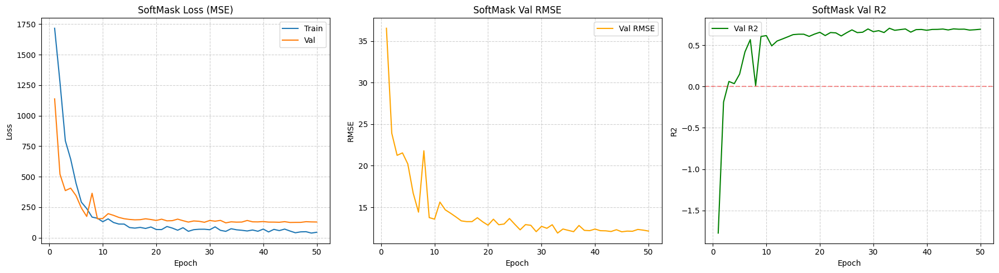

[SoftMask] 1x6 visualization on val index = 3


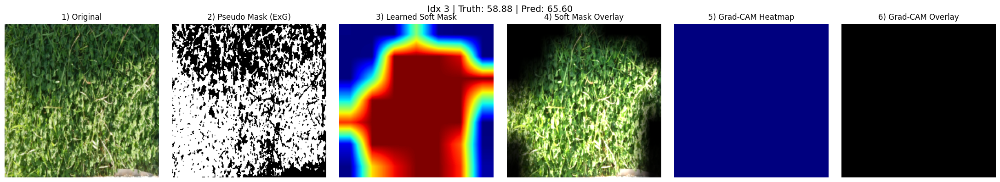


>>> Generating pseudo masks from SoftMask model...


Generating Pseudo Masks:   0%|          | 0/9 [00:00<?, ?it/s]

Generating Pseudo Masks:   0%|          | 0/3 [00:00<?, ?it/s]

MTL datasets ready: 285 72


In [8]:
# ==========================================
# Cell 2. Train SoftMask (SMA) + 產生 pseudo masks 給 MTL 用
# ==========================================
model_soft = PastureAblationModel(
    n_outputs=5,
    n_meta_features=len(META_COLS),
    use_soft_mask=True,
    use_mtl=False
)

model_soft, hist_soft = train_and_evaluate(
    model_soft,
    train_loader_base,
    val_loader_base,
    DEVICE,
    epochs=EPOCHS,
    lr=3e-4,
    lambda_seg=0.0,
    experiment_name="2_SoftMask"
)

histories["SoftMask"] = hist_soft
models_trained["SoftMask"] = model_soft

# 畫 SoftMask 的 Loss / RMSE / R2
plot_metrics(hist_soft, title_prefix="SoftMask")

# 1x6 視覺化（這個 model 有 soft mask，第三張 & 第四張圖會有內容）
idx = random.randint(0, len(val_dataset) - 1)
print(f"[SoftMask] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_soft,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)

# --- 用 SoftMask 模型產生 pseudo masks，給 MTL / Full 用 ---
print("\n>>> Generating pseudo masks from SoftMask model...")
train_masks = generate_pseudo_masks(model_soft, train_dataset, device=DEVICE)
val_masks = generate_pseudo_masks(model_soft, val_dataset, device=DEVICE)

train_dataset_mtl = MTLDataset(train_dataset, train_masks)
val_dataset_mtl = MTLDataset(val_dataset, val_masks)

train_loader_mtl = DataLoader(train_dataset_mtl, batch_size=32, shuffle=True, num_workers=2)
val_loader_mtl   = DataLoader(val_dataset_mtl,   batch_size=32, shuffle=False, num_workers=2)

print("MTL datasets ready:", len(train_dataset_mtl), len(val_dataset_mtl))


In [9]:
# ==========================================
# 6. Soft Mask → Pseudo Masks for MTL
# ==========================================
def generate_pseudo_masks(model_soft, dataset, device, threshold=0.4):
    """
    用 SoftMask 模型 (use_soft_mask=True) 產生 pseudo segmentation mask。
    """
    loader = DataLoader(dataset, batch_size=32, shuffle=False)
    model_soft.eval()
    model_soft.to(device)

    all_masks = []

    with torch.no_grad():
        for batch in tqdm(loader, desc="Generating Pseudo Masks"):
            imgs, metas, _ = batch
            imgs = imgs.to(device)
            metas = metas.to(device)

            out = model_soft(imgs, metas, return_viz=True)
            soft_mask = out['soft_mask']   # (B,1,7,7) or None

            if soft_mask is None:
                # 沒有 soft mask → 全 0
                b = imgs.size(0)
                for _ in range(b):
                    all_masks.append(np.zeros((224, 224), dtype=np.float32))
                continue

            m_np = soft_mask.cpu().numpy()     # (B,1,h,w)
            for j in range(m_np.shape[0]):
                m = m_np[j, 0]                 # (h,w)
                m_resized = cv2.resize(m, (224, 224), interpolation=cv2.INTER_CUBIC)
                m_bin = (m_resized > threshold).astype(np.float32)
                all_masks.append(m_bin)

    return np.array(all_masks)



===== Starting Experiment: 3_MTL =====


Train 3_MTL (Epoch 1):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 1):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 1/50 | Train Loss: 1704.1594 | Val Loss: 1104.4429 | Val RMSE: 36.0167 | Val R2: -1.6974


Train 3_MTL (Epoch 2):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 2):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 2/50 | Train Loss: 1258.5094 | Val Loss: 493.1307 | Val RMSE: 23.3216 | Val R2: -0.1310


Train 3_MTL (Epoch 3):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 3):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 3/50 | Train Loss: 754.4903 | Val Loss: 627.3445 | Val RMSE: 26.0030 | Val R2: -0.4060


Train 3_MTL (Epoch 4):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 4):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 4/50 | Train Loss: 555.2208 | Val Loss: 472.4917 | Val RMSE: 22.3885 | Val R2: -0.0423


Train 3_MTL (Epoch 5):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 5):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 5/50 | Train Loss: 404.7110 | Val Loss: 359.3446 | Val RMSE: 19.4406 | Val R2: 0.2141


Train 3_MTL (Epoch 6):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 6):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 6/50 | Train Loss: 365.3368 | Val Loss: 246.3359 | Val RMSE: 16.6497 | Val R2: 0.4236


Train 3_MTL (Epoch 7):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 7):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 7/50 | Train Loss: 323.8285 | Val Loss: 246.2854 | Val RMSE: 17.3378 | Val R2: 0.3749


Train 3_MTL (Epoch 8):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 8):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 8/50 | Train Loss: 231.5739 | Val Loss: 207.8817 | Val RMSE: 15.8047 | Val R2: 0.4806


Train 3_MTL (Epoch 9):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 9):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 9/50 | Train Loss: 211.0722 | Val Loss: 222.2327 | Val RMSE: 16.1137 | Val R2: 0.4601


Train 3_MTL (Epoch 10):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 10):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 10/50 | Train Loss: 163.3938 | Val Loss: 180.4624 | Val RMSE: 14.3910 | Val R2: 0.5694


Train 3_MTL (Epoch 11):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 11):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 11/50 | Train Loss: 162.2031 | Val Loss: 165.6804 | Val RMSE: 13.6798 | Val R2: 0.6109


Train 3_MTL (Epoch 12):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 12):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 12/50 | Train Loss: 107.0617 | Val Loss: 174.6880 | Val RMSE: 14.2919 | Val R2: 0.5753


Train 3_MTL (Epoch 13):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 13):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 13/50 | Train Loss: 128.6168 | Val Loss: 127.7563 | Val RMSE: 12.4310 | Val R2: 0.6787


Train 3_MTL (Epoch 14):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 14):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 14/50 | Train Loss: 103.7162 | Val Loss: 134.3685 | Val RMSE: 12.9609 | Val R2: 0.6507


Train 3_MTL (Epoch 15):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 15):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 15/50 | Train Loss: 123.1457 | Val Loss: 120.1723 | Val RMSE: 12.2380 | Val R2: 0.6886


Train 3_MTL (Epoch 16):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 16):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 16/50 | Train Loss: 100.2859 | Val Loss: 127.8861 | Val RMSE: 12.3336 | Val R2: 0.6837


Train 3_MTL (Epoch 17):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 17):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 17/50 | Train Loss: 80.7208 | Val Loss: 124.5266 | Val RMSE: 11.8989 | Val R2: 0.7056


Train 3_MTL (Epoch 18):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 18):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 18/50 | Train Loss: 105.2452 | Val Loss: 125.9611 | Val RMSE: 12.0752 | Val R2: 0.6968


Train 3_MTL (Epoch 19):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 19):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 19/50 | Train Loss: 89.9569 | Val Loss: 116.6660 | Val RMSE: 11.5687 | Val R2: 0.7217


Train 3_MTL (Epoch 20):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 20):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 20/50 | Train Loss: 107.9007 | Val Loss: 115.4846 | Val RMSE: 11.4129 | Val R2: 0.7292


Train 3_MTL (Epoch 21):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 21):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 21/50 | Train Loss: 88.7098 | Val Loss: 111.3103 | Val RMSE: 11.4271 | Val R2: 0.7285


Train 3_MTL (Epoch 22):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 22):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 22/50 | Train Loss: 102.2884 | Val Loss: 102.2760 | Val RMSE: 10.9563 | Val R2: 0.7504


Train 3_MTL (Epoch 23):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 23):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 23/50 | Train Loss: 92.9923 | Val Loss: 114.3384 | Val RMSE: 11.1594 | Val R2: 0.7411


Train 3_MTL (Epoch 24):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 24):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 24/50 | Train Loss: 69.2344 | Val Loss: 103.5902 | Val RMSE: 10.7255 | Val R2: 0.7608


Train 3_MTL (Epoch 25):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 25):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 25/50 | Train Loss: 72.2081 | Val Loss: 112.8751 | Val RMSE: 11.3940 | Val R2: 0.7300


Train 3_MTL (Epoch 26):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 26):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 26/50 | Train Loss: 108.8604 | Val Loss: 135.2217 | Val RMSE: 12.5712 | Val R2: 0.6714


Train 3_MTL (Epoch 27):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 27):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 27/50 | Train Loss: 71.3179 | Val Loss: 118.4512 | Val RMSE: 11.5162 | Val R2: 0.7242


Train 3_MTL (Epoch 28):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 28):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 28/50 | Train Loss: 60.9579 | Val Loss: 110.1298 | Val RMSE: 11.0630 | Val R2: 0.7455


Train 3_MTL (Epoch 29):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 29):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 29/50 | Train Loss: 54.6672 | Val Loss: 110.6890 | Val RMSE: 11.2808 | Val R2: 0.7354


Train 3_MTL (Epoch 30):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 30):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 30/50 | Train Loss: 61.1519 | Val Loss: 108.8901 | Val RMSE: 11.1551 | Val R2: 0.7412


Train 3_MTL (Epoch 31):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 31):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 31/50 | Train Loss: 48.5833 | Val Loss: 99.4226 | Val RMSE: 10.5945 | Val R2: 0.7666


Train 3_MTL (Epoch 32):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 32):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 32/50 | Train Loss: 57.1665 | Val Loss: 102.9103 | Val RMSE: 10.8461 | Val R2: 0.7554


Train 3_MTL (Epoch 33):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 33):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 33/50 | Train Loss: 62.7373 | Val Loss: 102.9357 | Val RMSE: 10.8689 | Val R2: 0.7544


Train 3_MTL (Epoch 34):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 34):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 34/50 | Train Loss: 49.9025 | Val Loss: 104.5695 | Val RMSE: 10.9861 | Val R2: 0.7490


Train 3_MTL (Epoch 35):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 35):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 35/50 | Train Loss: 58.7219 | Val Loss: 106.5763 | Val RMSE: 10.9831 | Val R2: 0.7492


Train 3_MTL (Epoch 36):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 36):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 36/50 | Train Loss: 47.5493 | Val Loss: 98.1927 | Val RMSE: 10.6217 | Val R2: 0.7654


Train 3_MTL (Epoch 37):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 37):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 37/50 | Train Loss: 48.9025 | Val Loss: 99.8261 | Val RMSE: 10.7650 | Val R2: 0.7590


Train 3_MTL (Epoch 38):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 38):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 38/50 | Train Loss: 50.5987 | Val Loss: 98.2837 | Val RMSE: 10.7019 | Val R2: 0.7618


Train 3_MTL (Epoch 39):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 39):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 39/50 | Train Loss: 48.5067 | Val Loss: 98.4674 | Val RMSE: 10.6873 | Val R2: 0.7625


Train 3_MTL (Epoch 40):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 40):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 40/50 | Train Loss: 66.2440 | Val Loss: 98.2554 | Val RMSE: 10.7114 | Val R2: 0.7614


Train 3_MTL (Epoch 41):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 41):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 41/50 | Train Loss: 65.1404 | Val Loss: 94.7952 | Val RMSE: 10.4997 | Val R2: 0.7708


Train 3_MTL (Epoch 42):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 42):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 42/50 | Train Loss: 46.1841 | Val Loss: 94.7231 | Val RMSE: 10.4574 | Val R2: 0.7726


Train 3_MTL (Epoch 43):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 43):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 43/50 | Train Loss: 56.4031 | Val Loss: 98.8281 | Val RMSE: 10.7179 | Val R2: 0.7611


Train 3_MTL (Epoch 44):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 44):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 44/50 | Train Loss: 53.0535 | Val Loss: 98.2273 | Val RMSE: 10.6742 | Val R2: 0.7631


Train 3_MTL (Epoch 45):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 45):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 45/50 | Train Loss: 54.5179 | Val Loss: 100.9478 | Val RMSE: 10.8239 | Val R2: 0.7564


Train 3_MTL (Epoch 46):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 46):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 46/50 | Train Loss: 45.3112 | Val Loss: 100.7220 | Val RMSE: 10.8545 | Val R2: 0.7550


Train 3_MTL (Epoch 47):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 47):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 47/50 | Train Loss: 54.0788 | Val Loss: 101.4348 | Val RMSE: 10.8942 | Val R2: 0.7532


Train 3_MTL (Epoch 48):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 48):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 48/50 | Train Loss: 71.8459 | Val Loss: 98.6746 | Val RMSE: 10.7185 | Val R2: 0.7611


Train 3_MTL (Epoch 49):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 49):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 49/50 | Train Loss: 62.5784 | Val Loss: 97.0497 | Val RMSE: 10.5902 | Val R2: 0.7668


Train 3_MTL (Epoch 50):   0%|          | 0/9 [00:00<?, ?it/s]

Val 3_MTL (Epoch 50):   0%|          | 0/3 [00:00<?, ?it/s]

[3_MTL] Epoch 50/50 | Train Loss: 69.6120 | Val Loss: 99.9647 | Val RMSE: 10.7141 | Val R2: 0.7613


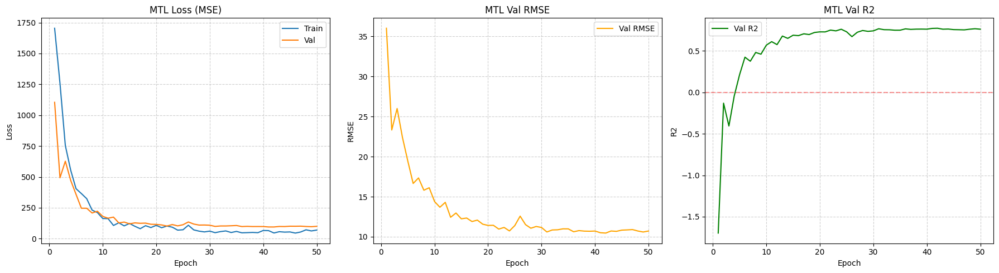

[MTL] 1x6 visualization on val index = 35


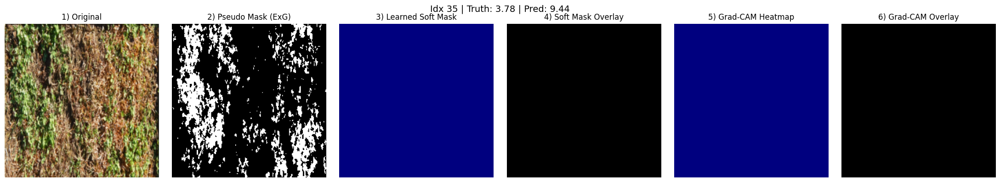

In [10]:
# ==========================================
# Cell 3. Train MTL only
# ==========================================
model_mtl = PastureAblationModel(
    n_outputs=5,
    n_meta_features=len(META_COLS),
    use_soft_mask=False,
    use_mtl=True
)

model_mtl, hist_mtl = train_and_evaluate(
    model_mtl,
    train_loader_mtl,
    val_loader_mtl,
    DEVICE,
    epochs=EPOCHS,
    lr=3e-4,
    lambda_seg=0.3,
    experiment_name="3_MTL"
)

histories["MTL"] = hist_mtl
models_trained["MTL"] = model_mtl

# 畫 MTL 的 Loss / RMSE / R2
plot_metrics(hist_mtl, title_prefix="MTL")

# 1x6 視覺化（MTL 沒 soft mask，所以 Learned Soft Mask 是黑的；
#  但有 seg_decoder，用不到的話就當作輔助 branch）
idx = random.randint(0, len(val_dataset) - 1)
print(f"[MTL] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_mtl,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)



===== Starting Experiment: 4_Full =====


Train 4_Full (Epoch 1):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 1):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 1/50 | Train Loss: 1688.8043 | Val Loss: 1081.3738 | Val RMSE: 35.6008 | Val R2: -1.6355


Train 4_Full (Epoch 2):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 2):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 2/50 | Train Loss: 1220.8972 | Val Loss: 379.4925 | Val RMSE: 20.8680 | Val R2: 0.0945


Train 4_Full (Epoch 3):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 3):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 3/50 | Train Loss: 663.2927 | Val Loss: 480.4239 | Val RMSE: 24.3326 | Val R2: -0.2312


Train 4_Full (Epoch 4):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 4):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 4/50 | Train Loss: 392.0344 | Val Loss: 271.3572 | Val RMSE: 17.9290 | Val R2: 0.3316


Train 4_Full (Epoch 5):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 5):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 5/50 | Train Loss: 311.5741 | Val Loss: 202.1741 | Val RMSE: 15.5477 | Val R2: 0.4973


Train 4_Full (Epoch 6):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 6):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 6/50 | Train Loss: 241.0441 | Val Loss: 243.8784 | Val RMSE: 16.7433 | Val R2: 0.4171


Train 4_Full (Epoch 7):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 7):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 7/50 | Train Loss: 156.8154 | Val Loss: 214.6821 | Val RMSE: 14.9803 | Val R2: 0.5334


Train 4_Full (Epoch 8):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 8):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 8/50 | Train Loss: 186.2005 | Val Loss: 215.4334 | Val RMSE: 15.4601 | Val R2: 0.5030


Train 4_Full (Epoch 9):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 9):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 9/50 | Train Loss: 167.6982 | Val Loss: 190.9547 | Val RMSE: 14.2751 | Val R2: 0.5763


Train 4_Full (Epoch 10):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 10):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 10/50 | Train Loss: 96.9369 | Val Loss: 190.2538 | Val RMSE: 14.0322 | Val R2: 0.5906


Train 4_Full (Epoch 11):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 11):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 11/50 | Train Loss: 153.5024 | Val Loss: 175.0843 | Val RMSE: 13.8049 | Val R2: 0.6037


Train 4_Full (Epoch 12):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 12):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 12/50 | Train Loss: 119.8586 | Val Loss: 180.9893 | Val RMSE: 14.1724 | Val R2: 0.5823


Train 4_Full (Epoch 13):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 13):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 13/50 | Train Loss: 104.1190 | Val Loss: 142.6012 | Val RMSE: 12.3595 | Val R2: 0.6824


Train 4_Full (Epoch 14):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 14):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 14/50 | Train Loss: 110.5804 | Val Loss: 138.7031 | Val RMSE: 12.6411 | Val R2: 0.6677


Train 4_Full (Epoch 15):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 15):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 15/50 | Train Loss: 116.4061 | Val Loss: 141.6657 | Val RMSE: 12.1185 | Val R2: 0.6946


Train 4_Full (Epoch 16):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 16):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 16/50 | Train Loss: 68.6601 | Val Loss: 175.5153 | Val RMSE: 14.0186 | Val R2: 0.5914


Train 4_Full (Epoch 17):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 17):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 17/50 | Train Loss: 87.8002 | Val Loss: 159.5689 | Val RMSE: 13.0564 | Val R2: 0.6455


Train 4_Full (Epoch 18):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 18):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 18/50 | Train Loss: 83.2396 | Val Loss: 134.8050 | Val RMSE: 12.7279 | Val R2: 0.6631


Train 4_Full (Epoch 19):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 19):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 19/50 | Train Loss: 91.5359 | Val Loss: 134.7574 | Val RMSE: 12.4267 | Val R2: 0.6789


Train 4_Full (Epoch 20):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 20):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 20/50 | Train Loss: 90.5756 | Val Loss: 136.2495 | Val RMSE: 12.3636 | Val R2: 0.6821


Train 4_Full (Epoch 21):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 21):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 21/50 | Train Loss: 53.8857 | Val Loss: 175.6859 | Val RMSE: 14.2586 | Val R2: 0.5772


Train 4_Full (Epoch 22):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 22):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 22/50 | Train Loss: 81.7296 | Val Loss: 130.4764 | Val RMSE: 11.8860 | Val R2: 0.7062


Train 4_Full (Epoch 23):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 23):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 23/50 | Train Loss: 67.8359 | Val Loss: 158.0019 | Val RMSE: 13.4063 | Val R2: 0.6263


Train 4_Full (Epoch 24):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 24):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 24/50 | Train Loss: 63.9885 | Val Loss: 122.7324 | Val RMSE: 11.5222 | Val R2: 0.7239


Train 4_Full (Epoch 25):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 25):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 25/50 | Train Loss: 69.6245 | Val Loss: 139.6733 | Val RMSE: 12.0723 | Val R2: 0.6970


Train 4_Full (Epoch 26):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 26):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 26/50 | Train Loss: 64.1952 | Val Loss: 146.5570 | Val RMSE: 13.0312 | Val R2: 0.6469


Train 4_Full (Epoch 27):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 27):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 27/50 | Train Loss: 49.6395 | Val Loss: 144.5808 | Val RMSE: 12.2667 | Val R2: 0.6871


Train 4_Full (Epoch 28):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 28):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 28/50 | Train Loss: 82.6602 | Val Loss: 142.9058 | Val RMSE: 12.6563 | Val R2: 0.6669


Train 4_Full (Epoch 29):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 29):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 29/50 | Train Loss: 65.9953 | Val Loss: 139.9150 | Val RMSE: 12.2303 | Val R2: 0.6890


Train 4_Full (Epoch 30):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 30):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 30/50 | Train Loss: 46.7500 | Val Loss: 129.1008 | Val RMSE: 11.6666 | Val R2: 0.7170


Train 4_Full (Epoch 31):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 31):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 31/50 | Train Loss: 52.4020 | Val Loss: 128.0708 | Val RMSE: 11.8408 | Val R2: 0.7085


Train 4_Full (Epoch 32):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 32):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 32/50 | Train Loss: 53.5438 | Val Loss: 119.5195 | Val RMSE: 11.6045 | Val R2: 0.7200


Train 4_Full (Epoch 33):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 33):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 33/50 | Train Loss: 69.3620 | Val Loss: 136.9727 | Val RMSE: 12.5445 | Val R2: 0.6728


Train 4_Full (Epoch 34):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 34):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 34/50 | Train Loss: 47.0133 | Val Loss: 142.9768 | Val RMSE: 12.6101 | Val R2: 0.6693


Train 4_Full (Epoch 35):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 35):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 35/50 | Train Loss: 46.6390 | Val Loss: 118.8222 | Val RMSE: 11.0774 | Val R2: 0.7448


Train 4_Full (Epoch 36):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 36):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 36/50 | Train Loss: 65.2865 | Val Loss: 138.5801 | Val RMSE: 12.2476 | Val R2: 0.6881


Train 4_Full (Epoch 37):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 37):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 37/50 | Train Loss: 51.6096 | Val Loss: 115.4600 | Val RMSE: 11.4860 | Val R2: 0.7257


Train 4_Full (Epoch 38):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 38):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 38/50 | Train Loss: 40.3114 | Val Loss: 113.8401 | Val RMSE: 11.2791 | Val R2: 0.7355


Train 4_Full (Epoch 39):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 39):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 39/50 | Train Loss: 78.3511 | Val Loss: 120.1636 | Val RMSE: 11.4454 | Val R2: 0.7276


Train 4_Full (Epoch 40):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 40):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 40/50 | Train Loss: 41.0430 | Val Loss: 113.4155 | Val RMSE: 11.3636 | Val R2: 0.7315


Train 4_Full (Epoch 41):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 41):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 41/50 | Train Loss: 38.4225 | Val Loss: 134.7674 | Val RMSE: 12.4030 | Val R2: 0.6801


Train 4_Full (Epoch 42):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 42):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 42/50 | Train Loss: 62.6629 | Val Loss: 115.6827 | Val RMSE: 11.3102 | Val R2: 0.7340


Train 4_Full (Epoch 43):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 43):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 43/50 | Train Loss: 43.1009 | Val Loss: 114.9822 | Val RMSE: 11.1647 | Val R2: 0.7408


Train 4_Full (Epoch 44):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 44):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 44/50 | Train Loss: 38.8523 | Val Loss: 112.6988 | Val RMSE: 11.3117 | Val R2: 0.7339


Train 4_Full (Epoch 45):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 45):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 45/50 | Train Loss: 28.0501 | Val Loss: 112.0521 | Val RMSE: 11.3184 | Val R2: 0.7336


Train 4_Full (Epoch 46):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 46):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 46/50 | Train Loss: 57.5644 | Val Loss: 131.7343 | Val RMSE: 12.3295 | Val R2: 0.6839


Train 4_Full (Epoch 47):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 47):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 47/50 | Train Loss: 57.9747 | Val Loss: 110.7936 | Val RMSE: 10.9611 | Val R2: 0.7502


Train 4_Full (Epoch 48):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 48):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 48/50 | Train Loss: 36.7381 | Val Loss: 106.0257 | Val RMSE: 10.8050 | Val R2: 0.7572


Train 4_Full (Epoch 49):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 49):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 49/50 | Train Loss: 45.1454 | Val Loss: 107.7910 | Val RMSE: 11.0635 | Val R2: 0.7455


Train 4_Full (Epoch 50):   0%|          | 0/9 [00:00<?, ?it/s]

Val 4_Full (Epoch 50):   0%|          | 0/3 [00:00<?, ?it/s]

[4_Full] Epoch 50/50 | Train Loss: 51.3870 | Val Loss: 111.8622 | Val RMSE: 11.0917 | Val R2: 0.7442


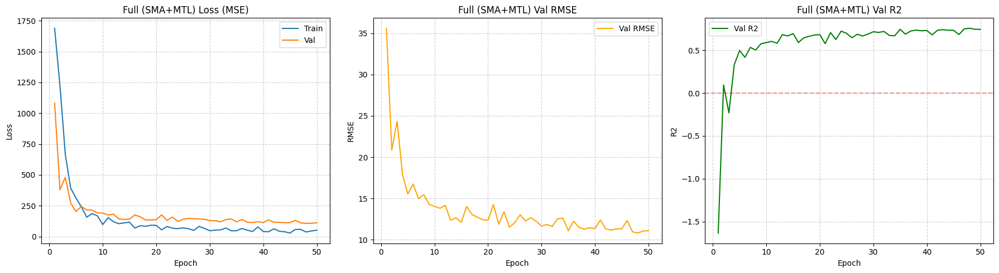

[Full] 1x6 visualization on val index = 31


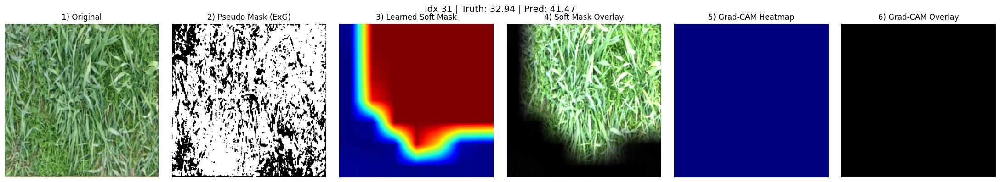

In [11]:
# ==========================================
# Cell 4. Train Full (SoftMask + MTL)
# ==========================================
model_full = PastureAblationModel(
    n_outputs=5,
    n_meta_features=len(META_COLS),
    use_soft_mask=True,
    use_mtl=True
)

model_full, hist_full = train_and_evaluate(
    model_full,
    train_loader_mtl,
    val_loader_mtl,
    DEVICE,
    epochs=EPOCHS,
    lr=3e-4,
    lambda_seg=0.3,
    experiment_name="4_Full"
)

histories["Full"] = hist_full
models_trained["Full"] = model_full

# 畫 Full 的 Loss / RMSE / R2
plot_metrics(hist_full, title_prefix="Full (SMA+MTL)")

# 1x6 視覺化（這個是你論文主角：有 SoftMask + MTL）
idx = random.randint(0, len(val_dataset) - 1)
print(f"[Full] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_full,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)


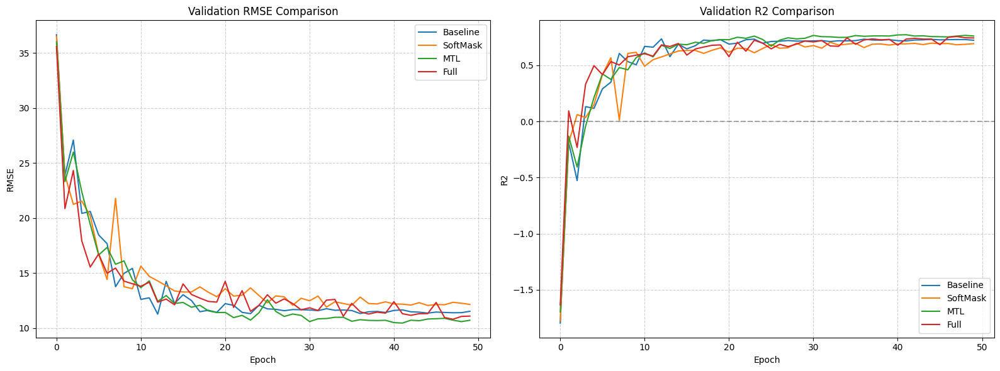


=== Final Model Summary ===
      Model  Best_RMSE   Best_R2      Params
0  Baseline  11.267871  0.735990   4,362,433
1  SoftMask  11.907406  0.705171   4,464,994
2       MTL  10.457355  0.772605  10,295,394
3      Full  10.805002  0.757235  10,397,955


In [12]:
# ==========================================
# Cell 5. Compare 4 models (RMSE / R2 curves & best metrics)
# ==========================================
import pandas as pd

models_order = ["Baseline", "SoftMask", "MTL", "Full"]
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

plt.figure(figsize=(16, 6))

# RMSE
plt.subplot(1, 2, 1)
for name, c in zip(models_order, colors):
    if name in histories:
        plt.plot(histories[name]['val_rmse'], label=name, color=c)
plt.title("Validation RMSE Comparison")
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

# R2
plt.subplot(1, 2, 2)
for name, c in zip(models_order, colors):
    if name in histories:
        plt.plot(histories[name]['val_r2'], label=name, color=c)
plt.axhline(0, color='black', linestyle='--', alpha=0.3)
plt.title("Validation R2 Comparison")
plt.xlabel("Epoch")
plt.ylabel("R2")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

# --- 列出每個模型最佳 RMSE / R2 + 參數量 ---
summary_rows = []
for name in models_order:
    if name not in histories:
        continue
    hist = histories[name]
    model = models_trained[name]
    best_rmse = min(hist['val_rmse'])
    best_r2   = max(hist['val_r2'])
    params = count_params(model)
    summary_rows.append({
        "Model": name,
        "Best_RMSE": best_rmse,
        "Best_R2": best_r2,
        "Params": f"{params:,}"
    })

summary_df = pd.DataFrame(summary_rows)
print("\n=== Final Model Summary ===")
print(summary_df)


In [ ]:
# ==========================================
# Cell 6. Inference & Submission 
# ==========================================
import numpy as np
import pandas as pd
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm

# 1) 選要用哪個模型來做 submission
#    可選: "Baseline", "SoftMask", "MTL", "Full"
submit_model_name = "Full"  

if submit_model_name not in models_trained:
    raise ValueError(f"Model '{submit_model_name}' not found in models_trained. "
                     f"Available: {list(models_trained.keys())}")

model_sub = models_trained[submit_model_name]
model_sub.to(DEVICE)
model_sub.eval()

print(f"=== Using [{submit_model_name}] model for inference & submission ===")

# 2) 準備 Test Dataset / DataLoader
test_dataset = PastureDataset(
    test_df,
    root_dir=BASE_DIR,
    transforms=val_transforms,
    target_cols=None,       # 測試集沒有 target
    meta_cols=META_COLS
)

test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2
)

print("Test samples:", len(test_dataset))

# 3) 做推論，拿到每張圖對 5 個 target 的預測值
all_preds = []

with torch.no_grad():
    for imgs, metas in tqdm(test_loader, desc=f"Inference ({submit_model_name})"):
        imgs = imgs.to(DEVICE)
        metas = metas.to(DEVICE)

        out = model_sub(imgs, metas)

        # 可能是 dict / tuple / tensor
        if isinstance(out, dict):
            pred = out['pred']
        elif isinstance(out, tuple):
            pred = out[0]    # (pred, seg)
        else:
            pred = out

        pred_np = pred.cpu().numpy()     # (B, 5)
        all_preds.append(pred_np)

all_preds = np.concatenate(all_preds, axis=0)   # (N_test, 5)
print("Prediction shape:", all_preds.shape)

# 4) 填回到 test_df 的 5 個欄位
pred_df = test_df.copy()
for i, col in enumerate(TARGET_COLS):
    pred_df[col] = all_preds[:, i]

# 5) 轉為官方 submission 格式：
#    test_df_raw 每列對應一個 (image_path, target_name)
submission = test_df_raw[['sample_id', 'image_path', 'target_name']].copy()
submission['target'] = 0.0

# 建立查表: {image_path: {target_name: value}}
pred_dict = pred_df.set_index('image_path')[TARGET_COLS].to_dict('index')

for idx, row in submission.iterrows():
    img_path = row['image_path']
    t_name = row['target_name']
    if img_path in pred_dict and t_name in pred_dict[img_path]:
        val = float(pred_dict[img_path][t_name])
        submission.at[idx, 'target'] = max(0.0, val)  # 確保不為負

# 6) 存成 CSV
sub_filename = f"submission_{submit_model_name}.csv"
submission[['sample_id', 'target']].to_csv(sub_filename, index=False)
print(f"Submission saved to: {sub_filename}")

# 7) 簡單檢查
print("\nSubmission preview:")
print(submission[['sample_id', 'image_path', 'target_name', 'target']].head())

print("\nTarget stats:")
print(submission['target'].describe())


=== Using [Full] model for inference & submission ===
Test samples: 1


Inference (Full):   0%|          | 0/1 [00:00<?, ?it/s]

Prediction shape: (1, 5)
Submission saved to: submission_Full.csv

Submission preview:
                    sample_id             image_path   target_name     target
0  ID1001187975__Dry_Clover_g  test/ID1001187975.jpg  Dry_Clover_g   0.000000
1    ID1001187975__Dry_Dead_g  test/ID1001187975.jpg    Dry_Dead_g   2.213020
2   ID1001187975__Dry_Green_g  test/ID1001187975.jpg   Dry_Green_g   0.000000
3   ID1001187975__Dry_Total_g  test/ID1001187975.jpg   Dry_Total_g   0.000000
4         ID1001187975__GDM_g  test/ID1001187975.jpg         GDM_g  25.269125

Target stats:
count     5.000000
mean      5.496429
std      11.094734
min       0.000000
25%       0.000000
50%       0.000000
75%       2.213020
max      25.269125
Name: target, dtype: float64


[Baseline] 1x6 visualization on val index = 44


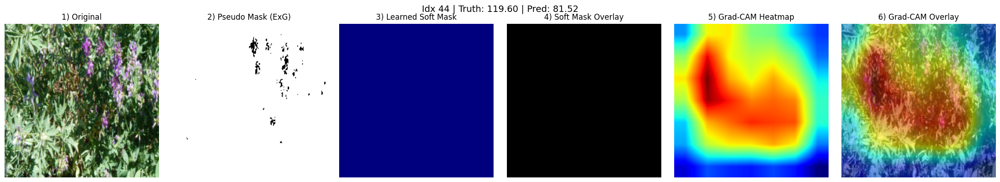

[SoftMask] 1x6 visualization on val index = 44


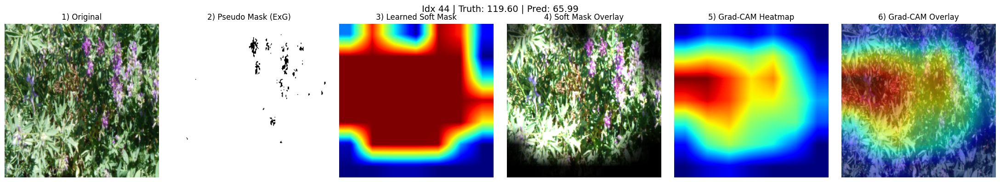

[MTL] 1x6 visualization on val index = 44


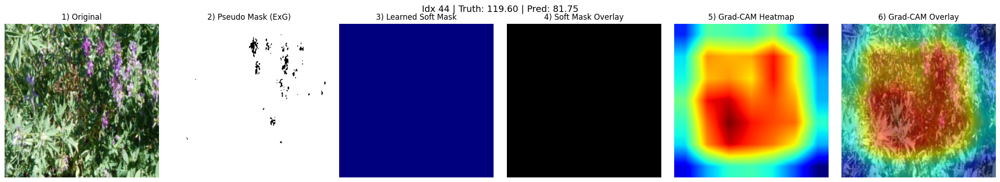

[Full] 1x6 visualization on val index = 44


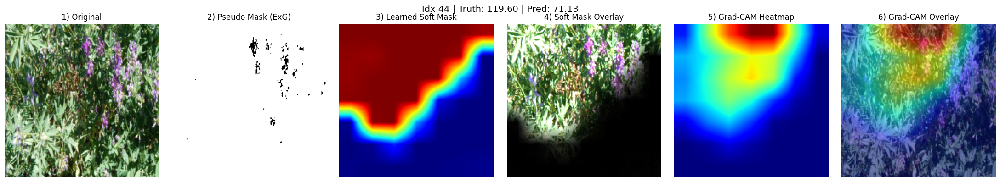

In [60]:
idx = random.randint(0, len(val_dataset) - 1)
print(f"[Baseline] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_base,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)
# idx = random.randint(0, len(val_dataset) - 1)
print(f"[SoftMask] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_soft,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)
# idx = random.randint(0, len(val_dataset) - 1)
print(f"[MTL] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_mtl,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)
# idx = random.randint(0, len(val_dataset) - 1)
print(f"[Full] 1x6 visualization on val index = {idx}")
visualize_analysis_1x6(
    model=model_full,
    dataset=val_dataset,
    idx=idx,
    device=DEVICE,
    target_col_idx=TARGET_GDM_IDX
)
